# Автоматический подбор музыки для видео

ноутбук запускает весь ML-пайплайн: скачивание подвыборки HarmonySet, подготовка manifest, извлечение признаков, обучение модели, оценка и демо топ-k рекомендаций

### Установка зависимостей

In [1]:
!apt-get -qq update
!apt-get -qq install -y ffmpeg
!pip -q install opencv-python librosa datasets yt-dlp pandas numpy matplotlib scikit-learn tqdm PyYAML

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.3/182.3 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 50.7 MB/s eta 0:00:00


### Подключение проекта

In [3]:
import os
import sys
from pathlib import Path

REPO_URL = 'https://github.com/mpaoloo/music-video-retrieval.git'
PROJECT_DIR = Path('/content/music-video-retrieval')

if REPO_URL and not PROJECT_DIR.exists():
    !git clone {REPO_URL} {PROJECT_DIR}

os.chdir(PROJECT_DIR)
sys.path.append(str(PROJECT_DIR))
print('Директория проекта:', PROJECT_DIR)
print('Файлы:', os.listdir(PROJECT_DIR)[:10])

Cloning into '/content/music-video-retrieval'...
remote: Enumerating objects: 106, done.
remote: Counting objects: 100% (106/106), done.
remote: Compressing objects: 100% (71/71), done.
remote: Total 106 (delta 46), reused 84 (delta 25), pack-reused 0 (from 0)
Receiving objects: 100% (106/106), 29.83 KiB | 2.98 MiB/s, done.
Resolving deltas: 100% (46/46), done.
Директория проекта: /content/music-video-retrieval
Файлы: ['README.md', 'notebooks', 'configs', 'src', '.git', 'requirements.txt', '.vscode', '.gitignore']


In [28]:
!cd /content/music-video-retrieval && git pull

Already up to date.


### Настройки эксперимента

Размер подвыборки исходного датасета

In [5]:
LIMIT = 1500

### Скачивание данных

HarmonySet хранит YouTube ссылки и текстовые аннотации. Сначала скачиваем метаданные и сами видео. Это довольно нестабильная часть проекта, потому что часть роликов может быть удалена или недоступна

In [6]:
!python -m src.data.download_harmonyset --limit {LIMIT}

Загружаем HarmonySet метаданные, limit=1500
HarmonySet_Train.json: 100% 132M/132M [00:02<00:00, 50.1MB/s]
Generating train split: 44470 examples [00:04, 10783.35 examples/s]
Сохраняем начальные метаданные в /content/music-video-retrieval/data/raw/harmonyset_subset.csv (начало загрузки)
[download] Got error: HTTPSConnectionPool(host='rr3---sn-qxoedn7k.googlevideo.com', port=443): Read timed out. (read timeout=20.0)
[download] Got error: HTTPSConnectionPool(host='rr1---sn-qxo7rne7.googlevideo.com', port=443): Read timed out. (read timeout=20.0)
Сохраняем метаданные в /content/music-video-retrieval/data/raw/harmonyset_subset.csv
Downloaded 1243/1500 videos


## 5. Manifest и EDA

Делаем таблицу manifest , в которой лежат только те видео, которые реально скачались и открываются через OpenCV. Здесь же происходит train/val/test split.

In [26]:
!python -m src.data.build_manifest

Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/content/music-video-retrieval/src/data/build_manifest.py", line 10, in <module>
    from src.utils import load_config, make_dir, project_path, set_seed
  File "/content/music-video-retrieval/src/utils.py", line 8, in <module>
    import torch
  File "/usr/local/lib/python3.12/dist-packages/torch/__init__.py", line 2204, in <module>
  File "/usr/local/lib/python3.12/dist-packages/torch/functional.py", line 8, in <module>
    import torch.nn.functional as F
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/__init__.py", line 9, in <module>
    from torch.nn import (
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/parallel/__init__.py", line 3, in <module>
    from torch.nn.parallel.data_parallel import data_parallel, DataParallel
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/parallel/data_parallel.py", line 18, in 

,pair_id,url,video_path,annotation,duration,fps,frames,split
0,6282,https://www.youtube.com/watch?v=K4j0i_y6y1I,/content/music-video-retrieval/data/raw/videos...,Rhythm and Synchronization: The music and vide...,31.966667,30.00000,959,train
1,29495,https://www.youtube.com/watch?v=E_JbmZ_xImw,/content/music-video-retrieval/data/raw/videos...,Rhythm and Synchronization: The music maintain...,20.360000,25.00000,509,train
2,31617,https://www.youtube.com/watch?v=_YYtTxpDLGk,/content/music-video-retrieval/data/raw/videos...,Here's an analysis of the provided video and m...,51.700000,30.00000,1551,train
3,44064,https://www.youtube.com/watch?v=LzUVknU2akk,/content/music-video-retrieval/data/raw/videos...,Rhythm and Synchronization: The video features...,59.466667,30.00000,1784,train
4,33937,https://www.youtube.com/watch?v=xvNZhQnG7Q8,/content/music-video-retrieval/data/raw/videos...,Rhythm and Synchronization: The video features...,14.981633,29.97003,449,train


Всего строк: 1243
split
train    870
test     187
val      186
Name: count, dtype: int64


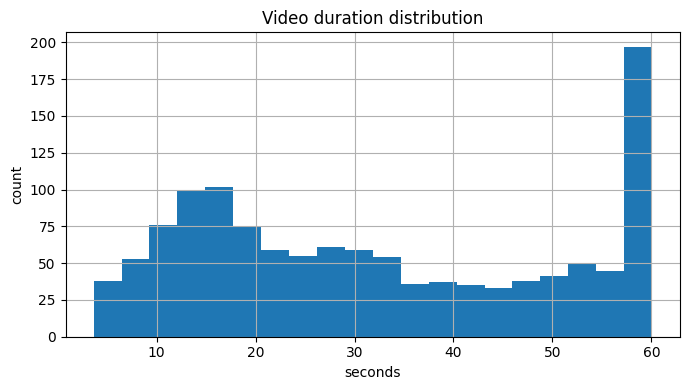

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import os

manifest = pd.read_csv('data/processed/manifest.csv')
display(manifest.head())
print('Всего строк:', len(manifest))
print(manifest['split'].value_counts())

plt.figure(figsize=(7, 4))
manifest['duration'].hist(bins=20)
plt.title('Video duration distribution')
plt.xlabel('seconds')
plt.ylabel('count')

os.makedirs('reports', exist_ok=True)
plt.tight_layout()
plt.savefig('reports/duration_distribution.png', dpi=160)
plt.show()

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Извлечение признаков

Для видео берём несколько кадров и пропускаем через ResNet50. Для аудио достаём дорожку через ffmpeg и считаем mel спектрограммы

In [12]:
!python -m src.features.extract_features

Используем девайс: cpu
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100% 97.8M/97.8M [00:01<00:00, 76.7MB/s]
Извлекаем признаки:   9% 118/1243 [11:31<1:49:27,  5.84s/it][mov,mp4,m4a,3gp,3g2,mj2 @ 0x40ba79c0] stream 0, offset 0xc2de: partial file
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x40ba79c0] stream 0, offset 0xd12f: partial file
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x40ba79c0] stream 0, offset 0xc2de: partial file
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x40ba79c0] stream 0, offset 0xd12f: partial file
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x40ba79c0] stream 0, offset 0xc2de: partial file
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x40ba79c0] stream 0, offset 0xc2de: partial file
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x40ba79c0] stream 0, offset 0xc2de: partial file
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x40ba79c0] stream 0, offset 0xc2de: partial file
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x40ba79c0] stream 0, offset 0xc2de: partial file
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x40ba79c0] stream 0, o

In [13]:
features = pd.read_csv('data/processed/features/features.csv')
display(features[['pair_id', 'split', 'video_feature_path', 'audio_feature_path']].head())
print('Feature rows:', len(features))
print(features['split'].value_counts())

,pair_id,split,video_feature_path,audio_feature_path
0,6282,train,/content/music-video-retrieval/data/processed/...,/content/music-video-retrieval/data/processed/...
1,29495,train,/content/music-video-retrieval/data/processed/...,/content/music-video-retrieval/data/processed/...
2,31617,train,/content/music-video-retrieval/data/processed/...,/content/music-video-retrieval/data/processed/...
3,44064,train,/content/music-video-retrieval/data/processed/...,/content/music-video-retrieval/data/processed/...
4,33937,train,/content/music-video-retrieval/data/processed/...,/content/music-video-retrieval/data/processed/...


Feature rows: 1238
split
train    867
test     187
val      184
Name: count, dtype: int64


### Обучение модели

Модель обучается так: в каждом batch есть несколько правильных пар video audio. Для каждого видео правильная музыка это аудио с тем же индексом в batch, остальные аудио считаются отрицательными примерами.

In [29]:
!python -m src.train

Epoch 01: loss=3.7731, val_hit@1=0.011, val_hit@5=0.054, val_mrr=0.047
Epoch 02: loss=3.7207, val_hit@1=0.011, val_hit@5=0.054, val_mrr=0.048
Epoch 03: loss=3.7082, val_hit@1=0.005, val_hit@5=0.043, val_mrr=0.041
Epoch 04: loss=3.7111, val_hit@1=0.016, val_hit@5=0.054, val_mrr=0.050
Epoch 05: loss=3.6670, val_hit@1=0.022, val_hit@5=0.054, val_mrr=0.053
Epoch 06: loss=3.6051, val_hit@1=0.005, val_hit@5=0.049, val_mrr=0.047
Epoch 07: loss=3.5680, val_hit@1=0.011, val_hit@5=0.043, val_mrr=0.051
Epoch 08: loss=3.4489, val_hit@1=0.011, val_hit@5=0.043, val_mrr=0.051
Epoch 09: loss=3.3818, val_hit@1=0.011, val_hit@5=0.054, val_mrr=0.049
Epoch 10: loss=3.2411, val_hit@1=0.011, val_hit@5=0.065, val_mrr=0.055
Epoch 11: loss=2.9920, val_hit@1=0.038, val_hit@5=0.054, val_mrr=0.069
Epoch 12: loss=2.8675, val_hit@1=0.022, val_hit@5=0.076, val_mrr=0.063
Epoch 13: loss=2.8323, val_hit@1=0.016, val_hit@5=0.082, val_mrr=0.059
Epoch 14: loss=2.6032, val_hit@1=0.016, val_hit@5=0.076, val_mrr=0.059
Epoch 

,epoch,train_loss,val_hit_at_1,val_hit_at_5,val_mrr
25,26,1.296482,0.016304,0.043478,0.050612
26,27,1.222716,0.021739,0.076087,0.061465
27,28,1.192401,0.021739,0.065217,0.058132
28,29,1.142219,0.010870,0.048913,0.044608
29,30,1.032482,0.010870,0.070652,0.054322


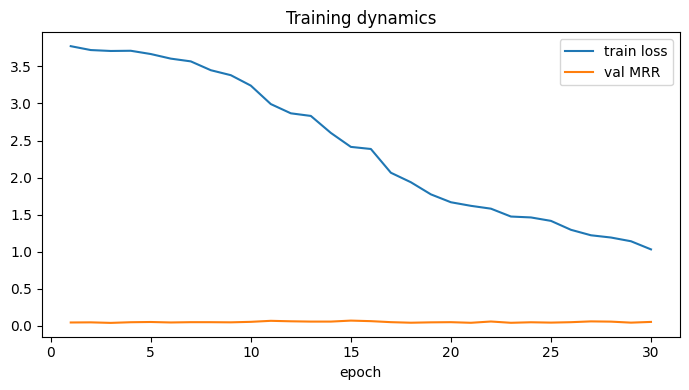

In [30]:
history = pd.read_csv('reports/training_history.csv')
display(history.tail())

plt.figure(figsize=(7, 4))
plt.plot(history['epoch'], history['train_loss'], label='train loss')
plt.plot(history['epoch'], history['val_mrr'], label='val MRR')
plt.legend()
plt.title('Training dynamics')
plt.xlabel('epoch')
plt.tight_layout()
plt.show()

### Оценка качества

Главные метрики: `Hit@1`, `Hit@5`, `MRR`. Также считаем random baseline, чтобы было понятно, лучше ли модель рандомного выбора аудио

In [33]:
!python -m src.evaluate --split test

Evaluation split: test
           name  hit_at_1  hit_at_5      mrr  mean_rank  num_queries  num_candidates  effective_top_k
          model  0.010695  0.032086 0.039412  84.005348        187.0           187.0                5
random_baseline  0.005348  0.026738 0.031075        NaN          NaN             NaN                5
Saved metrics to /content/music-video-retrieval/reports/metrics_test.csv


,name,hit_at_1,hit_at_5,mrr,mean_rank,num_queries,num_candidates,effective_top_k
0,model,0.010695,0.032086,0.039412,84.005348,187.0,187.0,5
1,random_baseline,0.005348,0.026738,0.031075,NaN,NaN,NaN,5


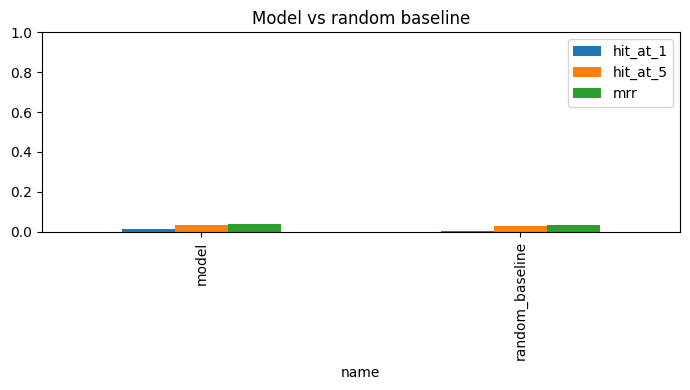

In [34]:
metrics = pd.read_csv('reports/metrics_test.csv')
display(metrics)

metrics.set_index('name')[['hit_at_1', 'hit_at_5', 'mrr']].plot(kind='bar', figsize=(7, 4))
plt.ylim(0, 1)
plt.title('Model vs random baseline')
plt.tight_layout()
plt.show()

### Демо: top-k рекомендаций

Здесь берём одно видео из test split и выводим топ-k аудиодорожек из базы. Если рядом с одной строкой написано `верный pair_id`, значит модель поставила исходную музыку этого видео в топ-k

In [46]:
!python -m src.infer --split test --row-index 108 --top-k 5

Запрошенное видео
pair_id: 29261
path: /content/music-video-retrieval/data/raw/videos/29261.mp4

Топ-5 рекомендованных аудио
1. pair_id=37330 score=0.496
   video/audio source: /content/music-video-retrieval/data/raw/videos/37330.mp4
   анотация: Rhythm and Synchronization: The music maintains a consistent medium tempo throughout, which generally aligns with the moderate pace of the video's choreography. The video features ...
2. pair_id=28436 score=0.458
   video/audio source: /content/music-video-retrieval/data/raw/videos/28436.mp4
   анотация: Rhythm and Synchronization: The music has a fast, driving beat with prominent electronic elements, creating a dynamic and energetic feel.  The video, however, is a static image wit...
3. pair_id=23219 score=0.440
   video/audio source: /content/music-video-retrieval/data/raw/videos/23219.mp4
   анотация: Rhythm and Synchronization: The fast-paced, rhythmic music contrasts sharply with the slow, deliberate actions within the video. The video it

In [48]:
# Получим путь запрошенного для инференса видео и запустим его в плеере
import pandas as pd
from pathlib import Path
from IPython.display import Video, display

features = pd.read_csv("data/processed/features/features.csv")
pid = "29261"
row = features.loc[features["pair_id"].astype(str) == str(pid)].iloc[0]


display(Video(row["video_path"], embed=True, width=480))


In [49]:
from IPython.display import HTML

# 5 pair_id из топа модели, сверху — лучший по мнению модели
top5_pair_ids = [
    "37330",
    "28436",
    "23219",
    "33448",
    "43126",
]

for rank, pid in enumerate(top5_pair_ids, start=1):
    m = features["pair_id"].astype(str) == str(pid)
    if not m.any():
        display(HTML(f"<p><b>{rank}.</b> pair_id=<code>{pid}</code> — нет в features.csv</p>"))
        continue
    row = features.loc[m].iloc[0]
    display(HTML(f"<hr><h4>{rank}. pair_id = {pid}</h4>"))

    display(HTML(f"<small>{row.get('annotation', '')}</small>"))
    display(Video(row["video_path"], embed=True, width=480))